In [1]:
import torch
import torchvision.transforms as T
from torchvision.models.vision_transformer import vit_b_16, ViT_B_16_Weights
from PIL import Image
import numpy as np
import os
from glob import glob
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

In [16]:
# Load DINO ViT-B/16
model = torch.hub.load('facebookresearch/dino:main', 'dino_vitb16')
model.eval()

# Use DINO's expected transform
transform = T.Compose([
    T.Resize(224),
    T.CenterCrop(224),
    T.ToTensor(),
    T.Normalize(mean=[0.5]*3, std=[0.5]*3)
])

Downloading: "https://github.com/facebookresearch/dino/zipball/main" to /Users/hemrajrana/.cache/torch/hub/main.zip
Downloading: "https://dl.fbaipublicfiles.com/dino/dino_vitbase16_pretrain/dino_vitbase16_pretrain.pth" to /Users/hemrajrana/.cache/torch/hub/checkpoints/dino_vitbase16_pretrain.pth
100%|██████████| 327M/327M [00:09<00:00, 37.4MB/s] 


In [17]:
def extract_patch_embeddings(image_path, model):
    image = Image.open(image_path).convert("RGB")
    x = transform(image).unsqueeze(0)  # [1, 3, 224, 224]

    with torch.no_grad():
        # This returns all tokens: [CLS] + 196 patches
        tokens = model.get_intermediate_layers(x, n=1)[0]  # shape: [1, 197, dim]

    # Remove CLS token → return only patch tokens
    patch_tokens = tokens[0, 1:]  # (196, dim)
    return patch_tokens.cpu().numpy()

In [21]:
from glob import glob

image_paths = glob("../data_cleaned/jouyou_kanji_grayscale/*.png")
all_patches = []
patch_to_image = []

for path in image_paths:
    try:
        patch_embeddings = extract_patch_embeddings(path, model)
        all_patches.extend(patch_embeddings)
        patch_to_image.extend([path] * len(patch_embeddings))
    except Exception as e:
        print(f"Failed to process {path}: {e}")


In [23]:
from sklearn.cluster import KMeans

num_clusters = 500
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
labels = kmeans.fit_predict(all_patches)

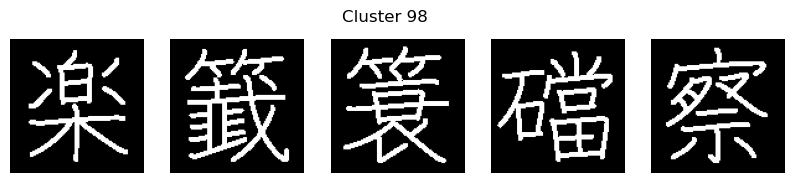

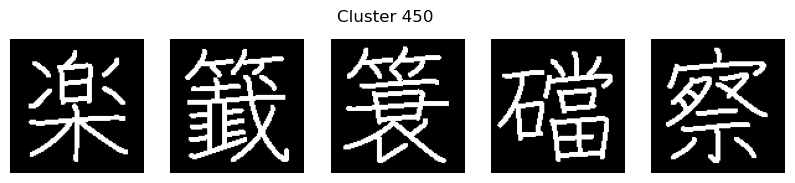

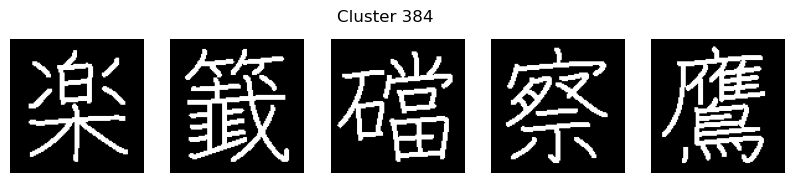

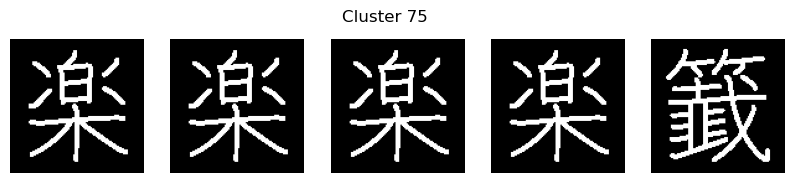

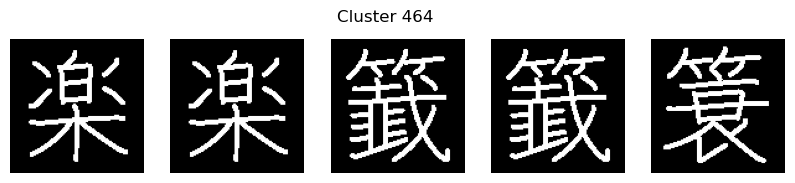

...

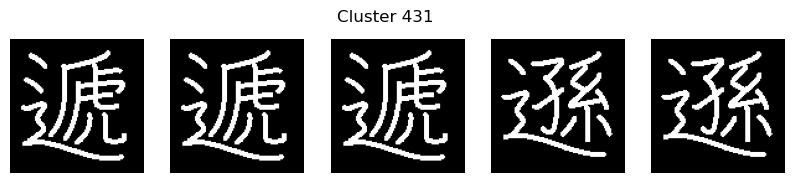

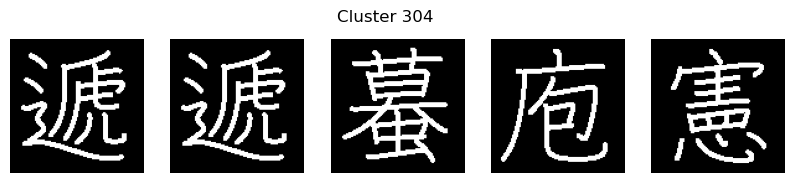

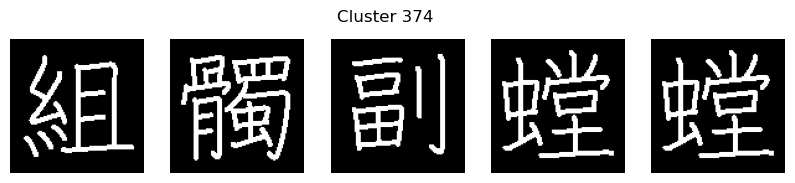

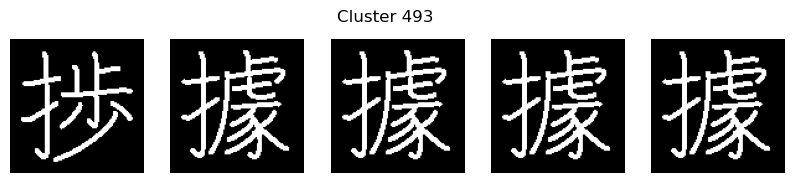

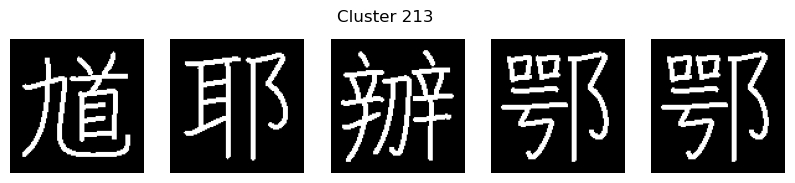

In [24]:
from collections import defaultdict

cluster_map = defaultdict(list)
for label, img_path in zip(labels, patch_to_image):
    if len(cluster_map[label]) < 5:  # limit per cluster
        cluster_map[label].append(img_path)

for label, paths in cluster_map.items():
    fig, axs = plt.subplots(1, len(paths), figsize=(len(paths)*2, 2))
    for i, p in enumerate(paths):
        axs[i].imshow(Image.open(p).convert("L"), cmap="gray")
        axs[i].axis("off")
    plt.suptitle(f"Cluster {label}")
    plt.show()
